In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib

## Downloading locally
- The easiest way to install diad fit is by removing the #, and running this once per computer. When I update the code, you'll need to get the new tag off GitHub:
https://github.com/PennyWieser/DiadFit/tags
Right click on the top one, over the 'zip' icon, click copy link address
- If youve already done this for Ne, you dont need to do here too

In [2]:
#!pip install --upgrade "https://github.com/PennyWieser/DiadFit/archive/refs/tags/0.0.11.zip"

### This imports DiadFit, and gives you the version. In all communication with Penny, make sure you say the version!


In [3]:
import DiadFit as pf
pf.__version__

'0.0.37'

In [4]:
## load dataframes and numpy arrays 
np_x = joblib.load('np_x.sav')

# What group do you want to fit?
batch='Weak' # Options are Weak, Medium, Strong

if batch=='Weak':
    GroupN_np_y=joblib.load('Group1_np.sav')
    GroupN_df=joblib.load('Group1_df.sav')

if batch=='Medium':
    GroupN_np_y=joblib.load('Group2_np.sav')
    GroupN_df=joblib.load('Group2_df.sav')

if batch=='Strong':
    GroupN_np_y=joblib.load('Group3_np.sav')
    GroupN_df=joblib.load('Group3_df.sav')

In [5]:
import os
DayFolder=os.getcwd()
meta_path=DayFolder +  '\MetaData'
spectra_path=DayFolder + '\Spectra'

In [7]:
# This specifies what file type your Raman exported in. 
filetype='headless_txt' # Specifies raman file format 
file_ext='.txt'
prefix=False

## Now load the files of interest

In [8]:
Diad_Files =GroupN_df['filename']
Diad_Files[0:5]

28    POC35.txt
29    POC36.txt
30    POC37.txt
31    POC38.txt
32    POC39.txt
Name: filename, dtype: object

POC40.txt


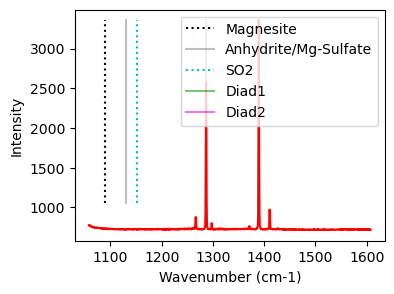

In [9]:
i=5
print(GroupN_df['filename'].iloc[i])
plot1=pf.plot_diad(Spectra_x=np_x, Spectra_y=GroupN_np_y[:, i])

## Now lets inspect the diads and get their approximate positions
- As with generic peak, you can exclude 2 segments (e.g. around cosmic rays)
- You then specify how many peaks you want to fit on each diad. 1 means just the strong peak, 2 hotbands, and 3 for Diad2 would also fit the C13 peak if present. 
- The identify_diad_peaks then uses scipy findpeaks to identify the positions of the 2 diads, and any other peaks the user asks for. These are saved, and fed into the later functions for peak fitting. 

In [14]:
## Choose a model - option, pseudovoigt or voigt
model_name='PseudoVoigtModel'
# Specify the number of peaks, 1 = just peak, 2 = Peak+hot bands


## Fit Diad 1
- You can tweak the parameters in diad1_fit_config

In [18]:
diad_id_config=pf.diad_id_config(height=50, exclude_range1=[1308, 1309])
diad_id_config

if batch=='Weak':
    diad1_fit_config_init=pf.diad1_fit_config(
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1220),
    upper_bck_diad1=(1330, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=1000, 
    HB_prom=GroupN_df['HB1_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_prom'].iloc[i])
    diad1_fit_config_init

if batch=='Medium':
    diad1_fit_config_init=pf.diad1_fit_config(
    model_name=model_name, fit_peaks=1,
    N_poly_bck_diad1=2, lower_bck_diad1=(1180, 1220),
    upper_bck_diad1=(1330, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=1000, 
    HB_prom=GroupN_df['HB1_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_prom'].iloc[i])
    diad1_fit_config_init

if batch=='Strong':
    diad1_fit_config_init=pf.diad1_fit_config(
    fit_gauss=True, gauss_amp= 2*GroupN_df['HB1_prom'].iloc[i],
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=2, lower_bck_diad1=(1180, 1220),
    upper_bck_diad1=(1330, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=1000, 
    HB_prom=GroupN_df['HB1_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_prom'].iloc[i])
diad1_fit_config_init

diad1_fit_config(model_name='PseudoVoigtModel', fit_peaks=2, fit_gauss=False, gauss_amp=1000, diad_sigma=0.6, diad_sigma_min_allowance=0.2, diad_sigma_max_allowance=5, N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1220), upper_bck_diad1=(1330, 1350), diad_prom=1842.5, HB_prom=154.0, x_range_baseline=30, y_range_baseline=1000, plot_figure=True, dpi=200, x_range_residual=10, return_other_params=False)

,Diad1_Combofit_Cent,Diad1_Voigt_Cent,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Diad1_Voigt_Gamma,HB1_Cent,HB1_Area,HB1_Sigma,Diad1_Combofit_Height,Residual_Diad1,Diad1_Prop_Lor,Diad1_fwhm,Diad1_refit
0,1286.53599,1286.53604,2815.11139,0.644219,None,1266.274304,292.905448,0.693251,1864.828391,4.476542,0.283936,1.288437,Flagged Warnings:


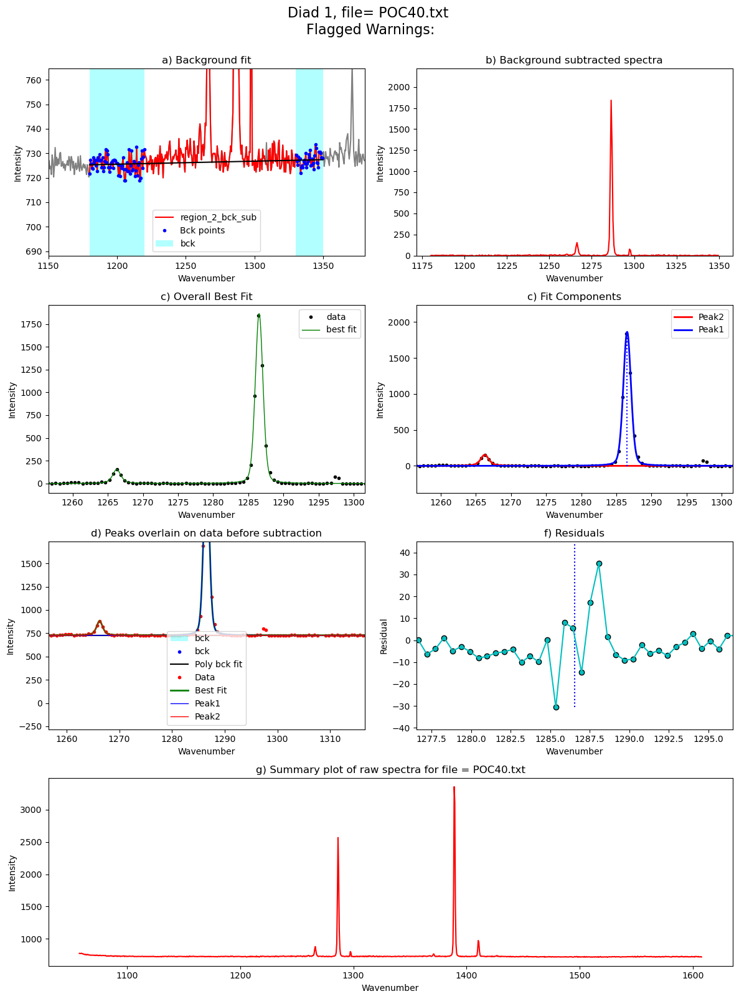

In [19]:
Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config_init,
config2=diad_id_config,
path=spectra_path, filename=GroupN_df['filename'].iloc[i],
filetype=filetype, close_figure=False,
Diad_pos=GroupN_df['Diad1_pos'].iloc[i],
HB_pos=GroupN_df['HB1_pos'].iloc[i])
Diad1_fit

In [20]:
diad1_fit_config2=diad1_fit_config_init
diad1_fit_config2.diad_sigma=Diad1_fit['Diad1_Voigt_Sigma'][0]
diad1_fit_config2.sigma_allowance=2
diad1_fit_config2

diad1_fit_config(model_name='PseudoVoigtModel', fit_peaks=2, fit_gauss=False, gauss_amp=1000, diad_sigma=0.6442186231345024, diad_sigma_min_allowance=0.2, diad_sigma_max_allowance=5, N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1220), upper_bck_diad1=(1330, 1350), diad_prom=1842.5, HB_prom=154.0, x_range_baseline=30, y_range_baseline=1000, plot_figure=True, dpi=200, x_range_residual=10, return_other_params=False)

## Fit diad 2

In [21]:
if batch=='Weak':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=2,
    lower_bck_diad2=(1310, 1340), diad_sigma=1,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=1000,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_prom'].iloc[i])
    diad2_fit_config_init

if batch=='Medium':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=3, fit_gauss=True, gauss_amp= 2*GroupN_df['HB2_prom'].iloc[i],
    lower_bck_diad2=(1310, 1340), diad_sigma=1,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=1000,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_prom'].iloc[i])
    diad2_fit_config_init

if batch=='Strong':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=3, fit_gauss=True, gauss_amp= 2*GroupN_df['HB2_prom'].iloc[i],
    lower_bck_diad2=(1310, 1340), diad_sigma=1,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=1000,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_prom'].iloc[i])
    diad2_fit_config_init
diad2_fit_config_init

diad2_fit_config(model_name='PseudoVoigtModel', fit_peaks=2, fit_gauss=False, gauss_amp=1000, diad_sigma=1, diad_sigma_min_allowance=0.2, diad_sigma_max_allowance=5, C13_sigma=0.1, sigma_allowance=10, N_poly_bck_diad2=2, lower_bck_diad2=(1310, 1340), upper_bck_diad2=(1440, 1470), diad_prom=2632.499939, HB_prom=251.33337400000005, x_range_baseline=30, y_range_baseline=1000, plot_figure=True, dpi=200, x_range_residual=30, return_other_params=False)

,Diad2_Combofit_Cent,Diad2_Voigt_Cent,Diad2_Voigt_Area,Diad2_Voigt_Sigma,Diad2_Voigt_Gamma,HB2_Cent,HB2_Area,HB2_Sigma,Diad2_Combofit_Height,Residual_Diad2,Diad2_Prop_Lor,Diad2_fwhm,Diad2_refit
0,1389.340201,1389.340151,4094.473467,0.595756,None,1410.586531,416.157873,0.631199,2912.053064,4.06073,0.303936,1.191511,Flagged Warnings:


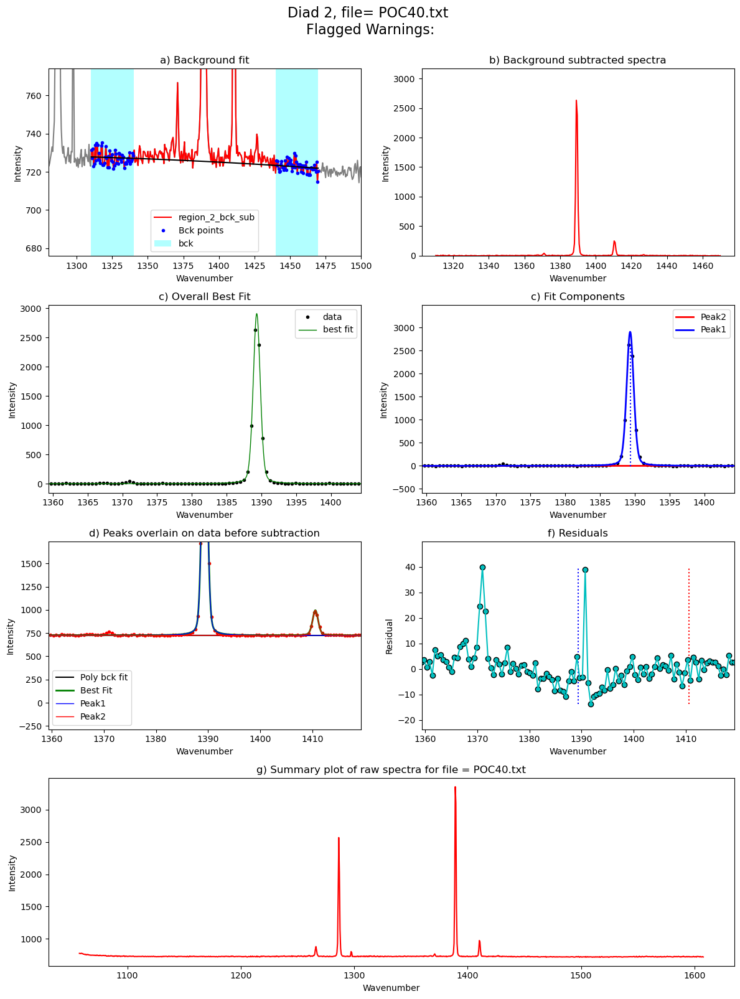

In [22]:
Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_init,
    config2=diad_id_config,
path=spectra_path, filename=GroupN_df['filename'].iloc[i], filetype=filetype,
close_figure=False, 
fit_peaks=3, 
Diad_pos=GroupN_df['Diad2_pos'].iloc[i],
HB_pos=GroupN_df['HB2_pos'].iloc[i], 
C13_pos=GroupN_df['C13_pos'].iloc[i])
Diad2_fit.to_clipboard(excel=True)
Diad2_fit

In [23]:
diad2_fit_config2=diad2_fit_config_init
diad2_fit_config2.diad_sigma=Diad2_fit['Diad2_Voigt_Sigma'][0]
diad2_fit_config2.sigma_allowance=2
diad2_fit_config2

diad2_fit_config(model_name='PseudoVoigtModel', fit_peaks=2, fit_gauss=False, gauss_amp=1000, diad_sigma=0.5957555943661255, diad_sigma_min_allowance=0.2, diad_sigma_max_allowance=5, C13_sigma=0.1, sigma_allowance=2, N_poly_bck_diad2=2, lower_bck_diad2=(1310, 1340), upper_bck_diad2=(1440, 1470), diad_prom=2632.499939, HB_prom=251.33337400000005, x_range_baseline=30, y_range_baseline=1000, plot_figure=True, dpi=200, x_range_residual=30, return_other_params=False)

## You can also try looping if all your spectra are pretty similar

 42%|██████████████████████████████████▏                                               | 10/24 [00:19<00:28,  2.04s/it]g:\my drive\berkeley_new\diadfit_outer\src\DiadFit\diads.py:2548: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,axes=plt.subplot_mosaic(mosaic=figure_mosaic, figsize=(12, 16))
 58%|███████████████████████████████████████████████▊                                  | 14/24 [00:28<00:21,  2.14s/it]

Either no hb position, or prominence<-50, using 1 fit


 62%|███████████████████████████████████████████████████▎                              | 15/24 [00:30<00:19,  2.13s/it]

Either no hb position, or prominence<-50, using 1 fit


 67%|██████████████████████████████████████████████████████▋                           | 16/24 [00:32<00:17,  2.19s/it]

Either no hb position, or prominence<-50, using 1 fit


 71%|██████████████████████████████████████████████████████████                        | 17/24 [00:34<00:14,  2.07s/it]

Either no hb position, or prominence<-50, using 1 fit


 75%|█████████████████████████████████████████████████████████████▌                    | 18/24 [00:36<00:12,  2.10s/it]

Either no hb position, or prominence<-50, using 1 fit


 79%|████████████████████████████████████████████████████████████████▉                 | 19/24 [00:38<00:10,  2.12s/it]

Either no hb position, or prominence<-50, using 1 fit


 83%|████████████████████████████████████████████████████████████████████▎             | 20/24 [00:40<00:08,  2.15s/it]

Either no hb position, or prominence<-50, using 1 fit


 88%|███████████████████████████████████████████████████████████████████████▊          | 21/24 [00:43<00:06,  2.24s/it]

Either no hb position, or prominence<-50, using 1 fit


 92%|███████████████████████████████████████████████████████████████████████████▏      | 22/24 [00:45<00:04,  2.17s/it]

Either no hb position, or prominence<-50, using 1 fit


 96%|██████████████████████████████████████████████████████████████████████████████▌   | 23/24 [00:53<00:03,  3.91s/it]

Either no hb position, or prominence<-50, using 1 fit


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [00:56<00:00,  2.34s/it]


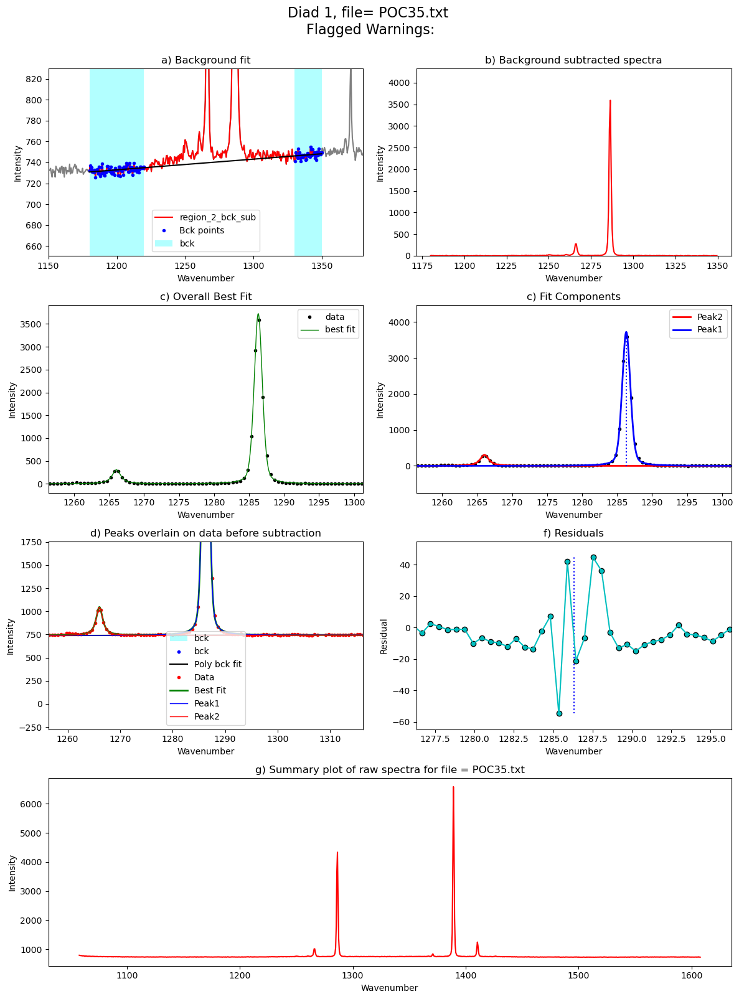

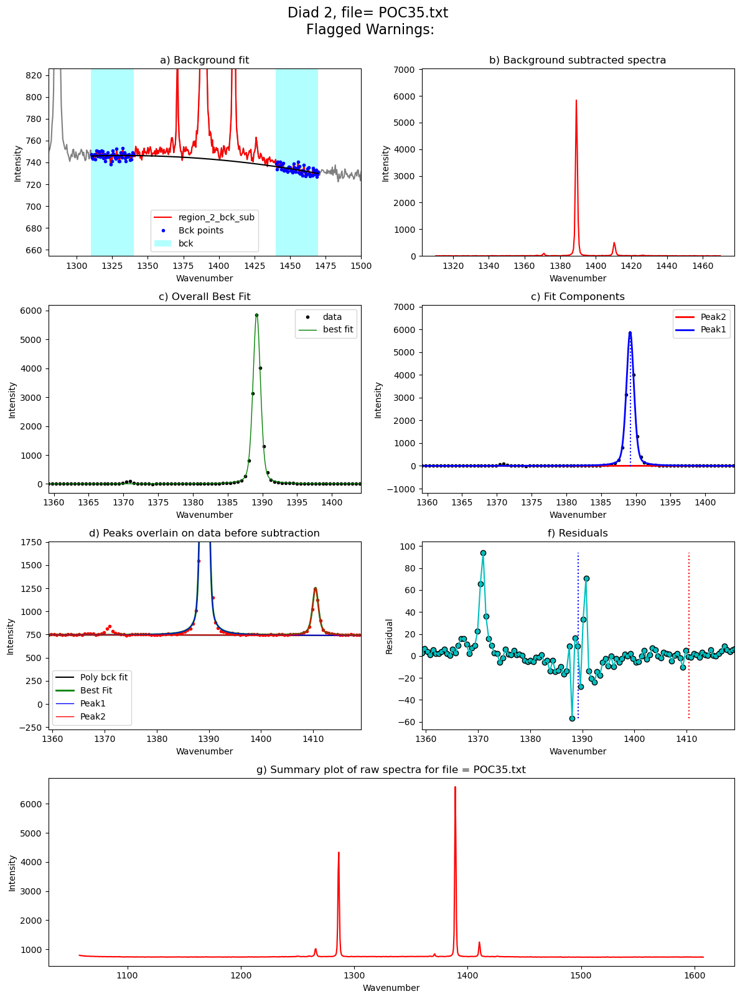

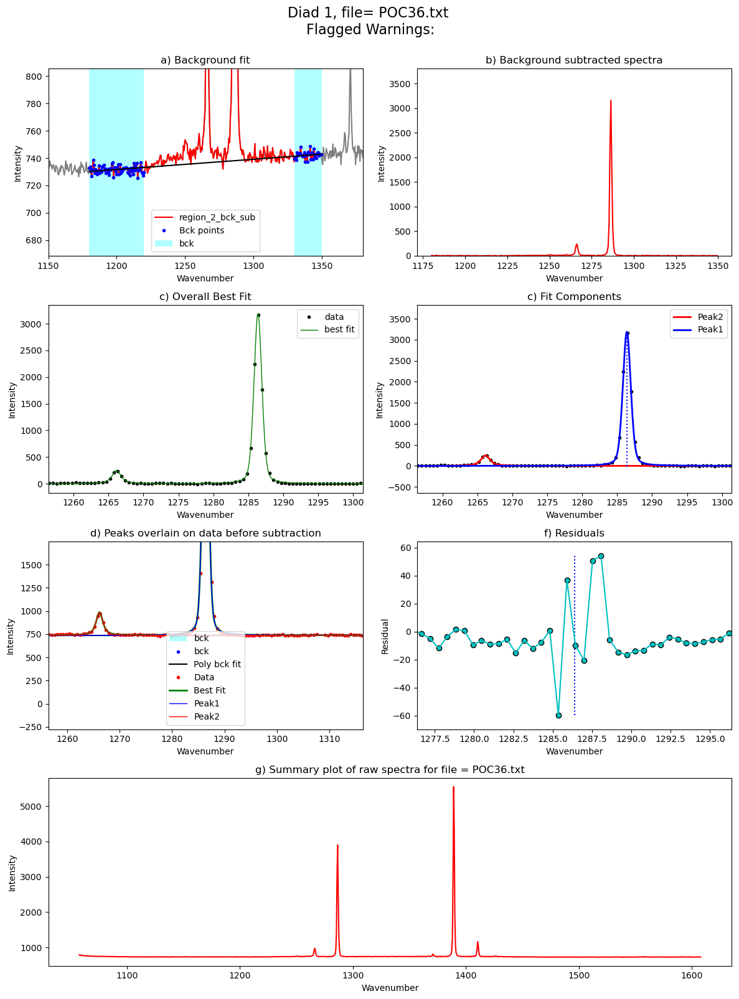

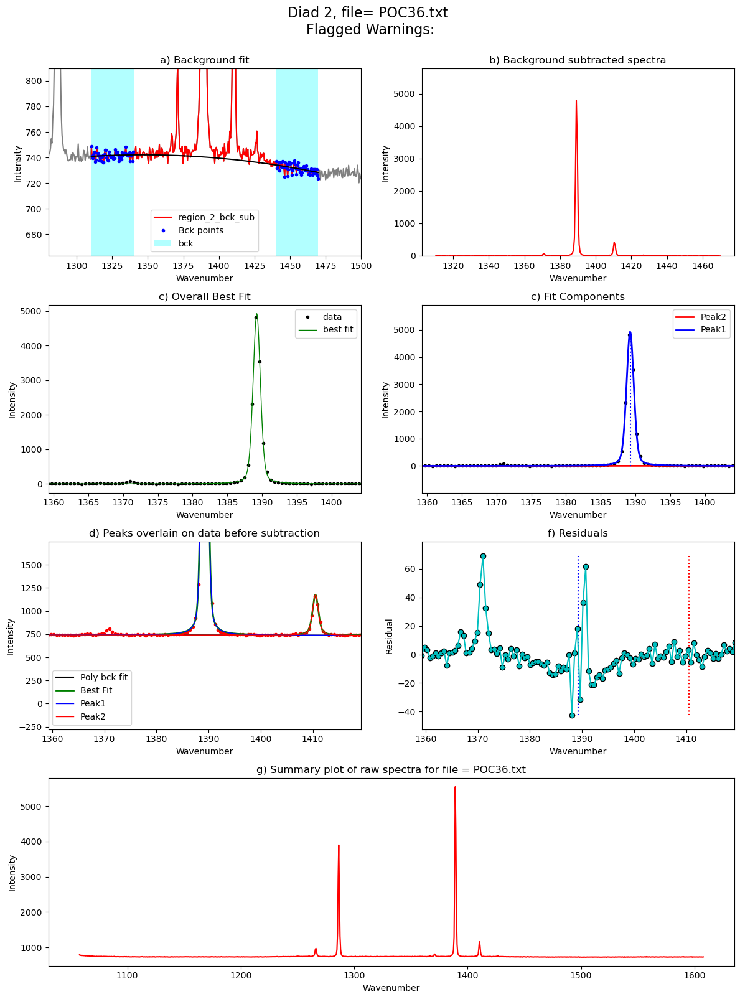

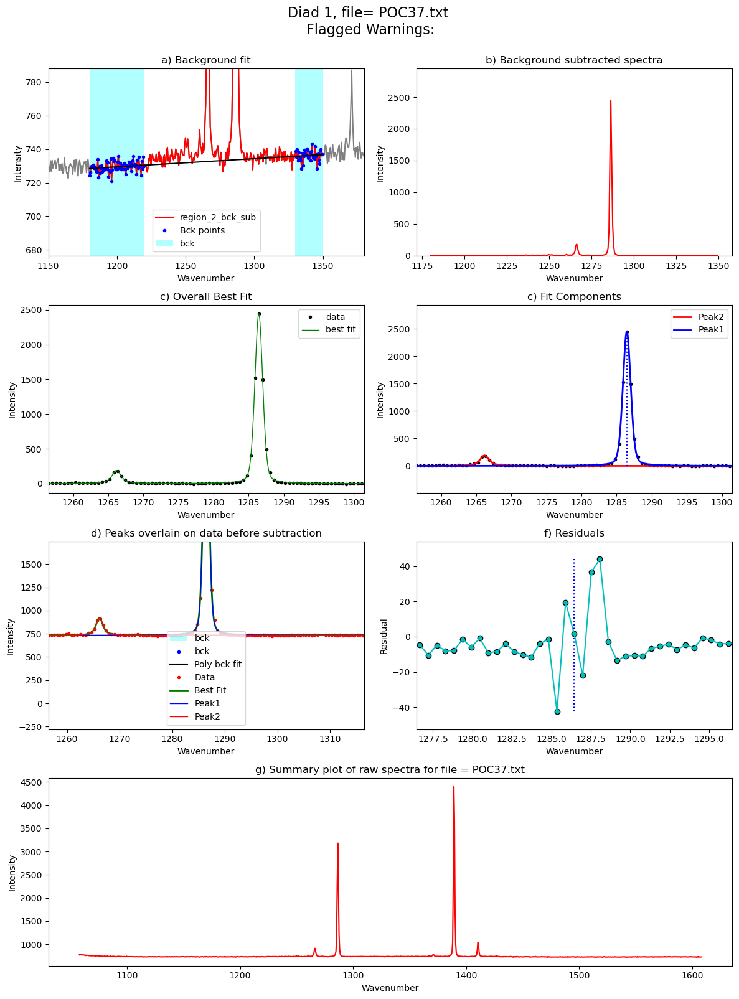

...

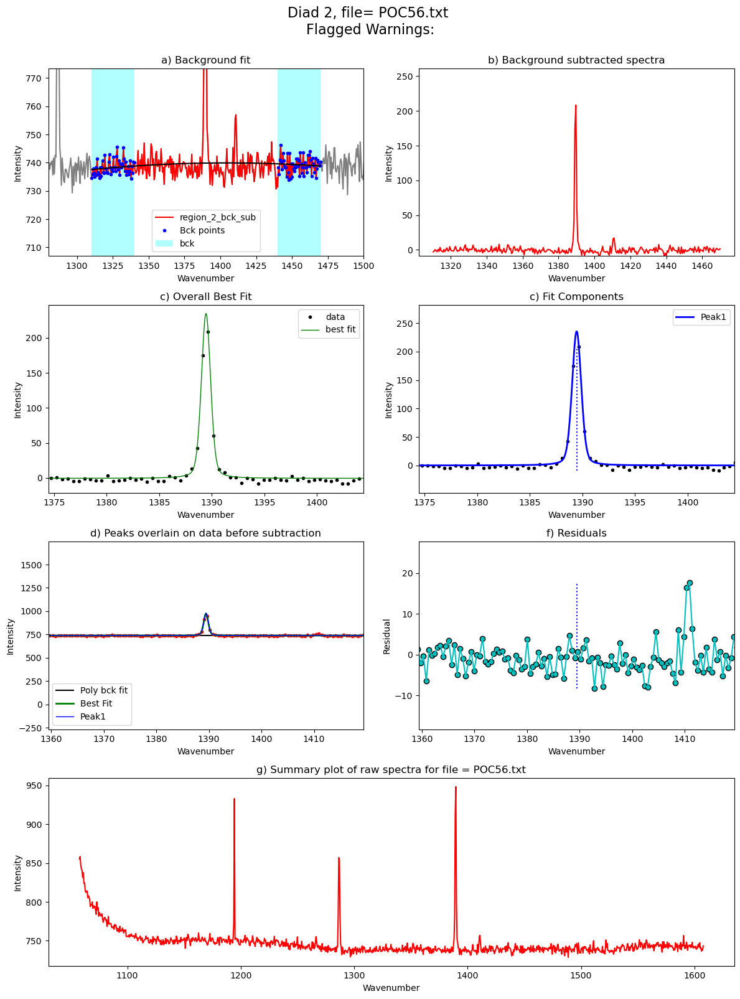

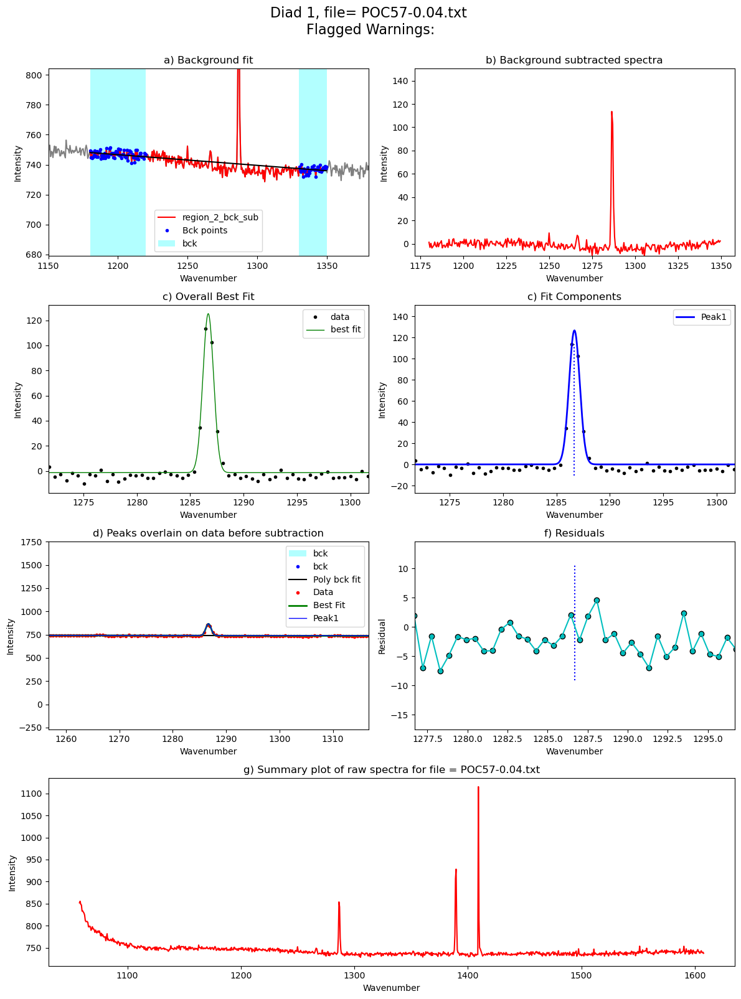

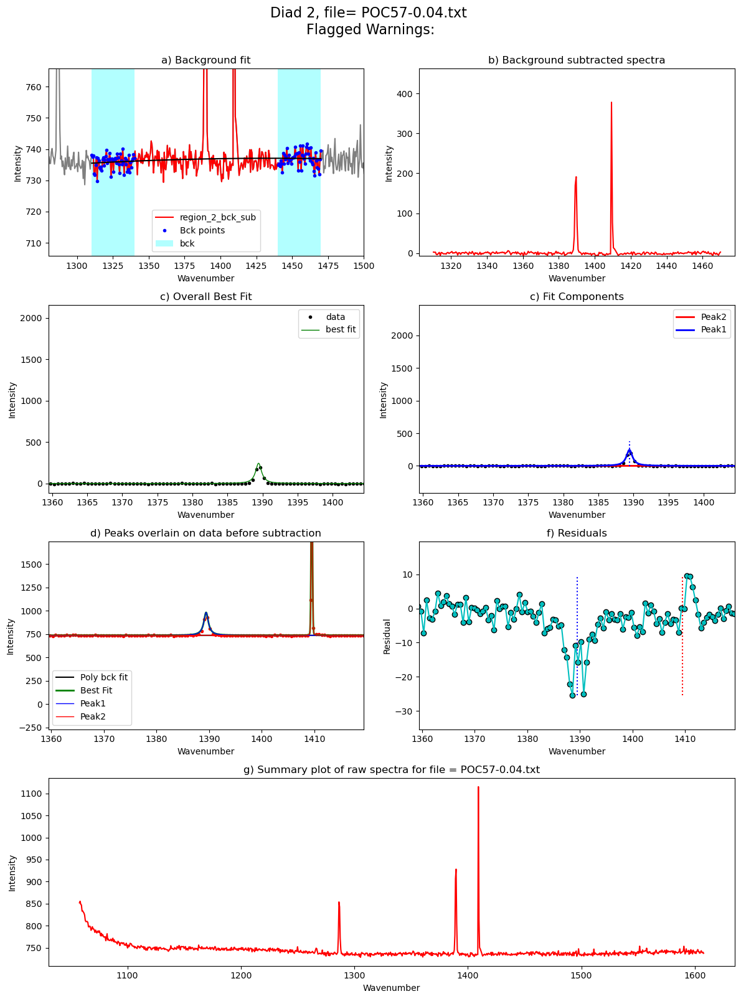

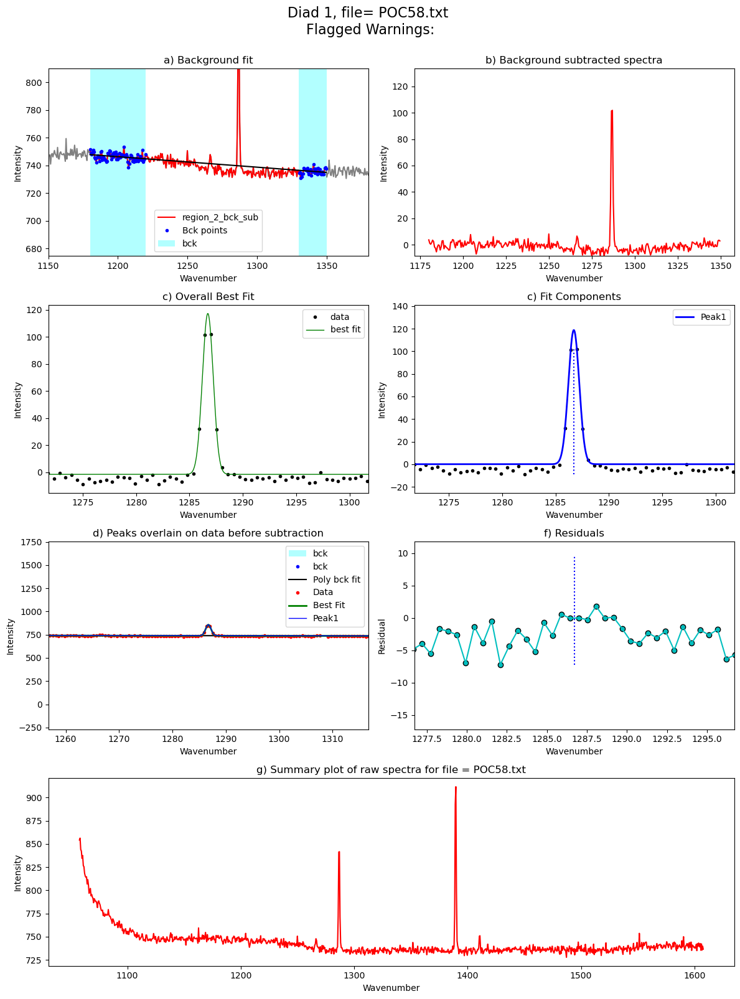

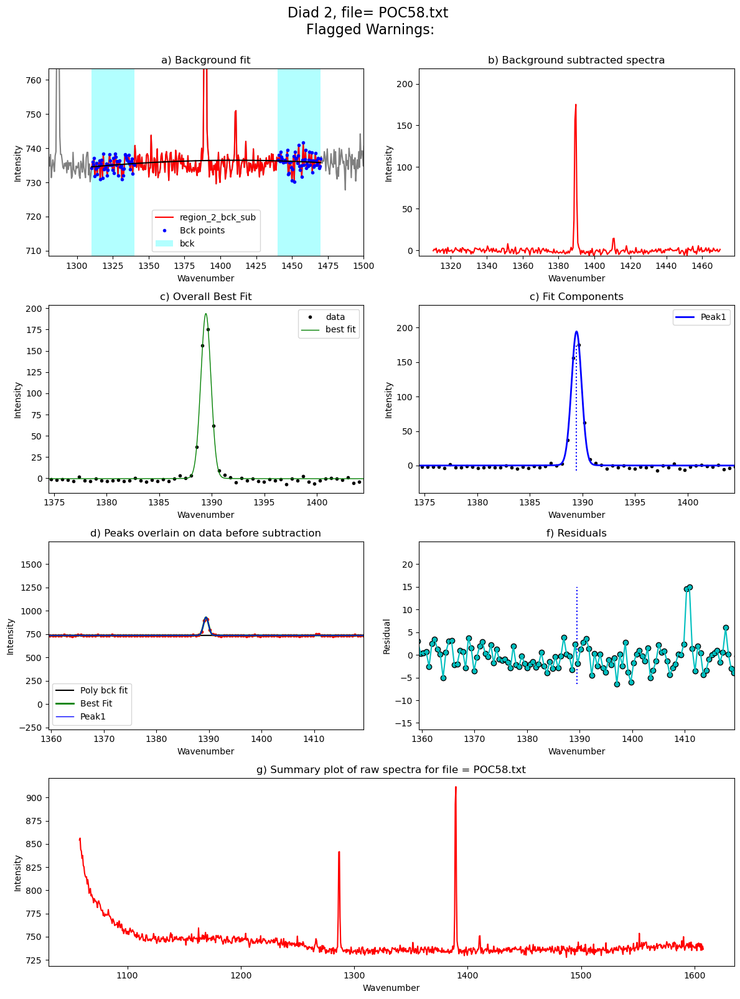

In [24]:
from tqdm import tqdm
plot_figure=True # If False, Means doesnt have to make figures, lot faster. 
close_figure=False # Means shows figures in the notebook itself
to_clipboard=False # Copies to clipboard
Diad_Files_i=Diad_Files
df_Merge = pd.DataFrame([])
for i in tqdm(range(0, len(Diad_Files))): #
    
    ## Diad 1 fit

    diad_id_config=pf.diad_id_config(height=50,exclude_range1=[1308, 1309])
    

    diad1_fit_config2.HB_prom=GroupN_df['HB1_prom'].iloc[i]
    diad1_fit_config2.Diad_prom=GroupN_df['Diad1_prom'].iloc[i]

    Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config2,
    config2=diad_id_config, path=spectra_path, filename=GroupN_df['filename'].iloc[i],
    filetype=filetype, close_figure=False,
    Diad_pos=GroupN_df['Diad1_pos'].iloc[i],
HB_pos=GroupN_df['HB1_pos'].iloc[i])
    



    ## Diad 2
    diad2_fit_config2.HB_prom=GroupN_df['HB2_prom'].iloc[i]
    diad2_fit_config2.Diad_prom=GroupN_df['Diad2_prom'].iloc[i]
    

    Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config2,
        config2=diad_id_config,
    path=spectra_path, filename=GroupN_df['filename'].iloc[i], filetype=filetype,
    close_figure=False, Diad_pos=GroupN_df['Diad2_pos'].iloc[i],
HB_pos=GroupN_df['HB2_pos'].iloc[i], 
C13_pos=GroupN_df['C13_pos'].iloc[i])
    


 
    fit_sec_peak=False

    data=pf.combine_diad_outputs(filename=GroupN_df['filename'].iloc[i], prefix=False, 
    Diad1_fit=Diad1_fit, path=spectra_path,
     to_clipboard=to_clipboard,                    
    Diad2_fit=Diad2_fit)        
    
 

    df_Merge = pd.concat([df_Merge, data], axis=0)


## EXport file names that still arent happy

In [17]:
refit_d1=(df_Merge['Diad1_refit']!='Flagged Warnings:')
refit_d2=(df_Merge['Diad2_refit']!='Flagged Warnings:')# (df_Merge['Diad2_refit']==True)
refit=refit_d1|refit_d2
print(sum(refit))
refit_names_1=df_Merge['filename'].loc[refit]
print(refit_names_1)

1
0    15 MP2_57_100X_FIB_8mW
Name: filename, dtype: object


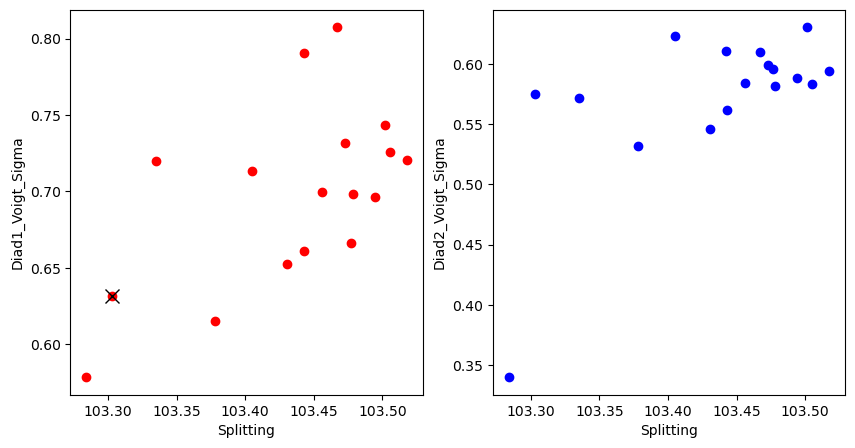

In [18]:

x='Splitting'
y1='Diad1_Voigt_Sigma'
y2='Diad2_Voigt_Sigma'
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
ax1.plot(df_Merge[x], df_Merge[y1], 'or')
ax2.plot(df_Merge[x], df_Merge[y2], 'ob')
ax1.plot(df_Merge[x].loc[refit_d1], df_Merge[y1].loc[refit_d1], 'xk', ms=10)
ax2.plot(df_Merge[x].loc[refit_d2], df_Merge[y2].loc[refit_d2], 'xk', ms=10)
ax1.set_xlabel(x)
ax2.set_xlabel(x)
ax1.set_ylabel(y1)
ax2.set_ylabel(y2)
df_not_too_Weak=df_Merge #.loc[(df_Merge['Diad1_Voigt_Area']>25) & (df_Merge['Diad2_Voigt_Area']>30)]

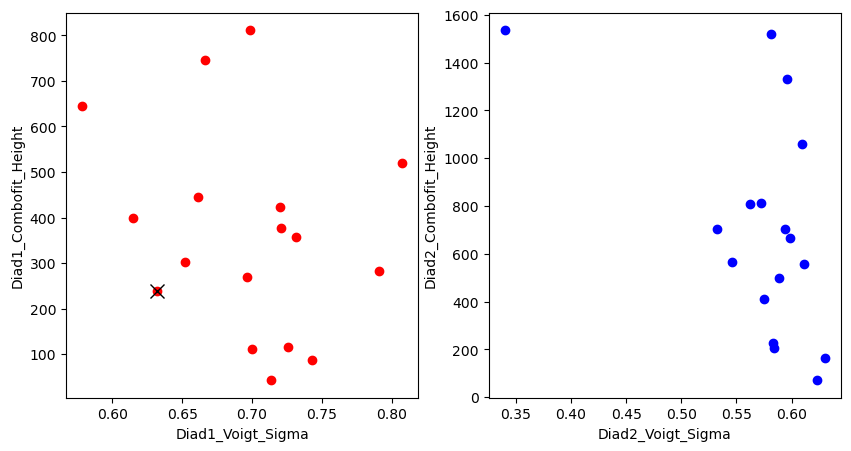

In [19]:
x1='Diad1_Voigt_Sigma'
x2='Diad2_Voigt_Sigma'
y1='Diad1_Combofit_Height'
y2='Diad2_Combofit_Height'
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
ax1.plot(df_Merge[x1], df_Merge[y1], 'or')
ax2.plot(df_Merge[x2], df_Merge[y2], 'ob')
ax1.plot(df_Merge[x1].loc[refit_d1], df_Merge[y1].loc[refit_d1], 'xk', ms=10)
ax2.plot(df_Merge[x2].loc[refit_d2], df_Merge[y2].loc[refit_d2], 'xk', ms=10)

ax1.set_xlabel(x1)
ax1.set_ylabel(y1)
ax2.set_xlabel(x2)
ax2.set_ylabel(y2)
df_not_too_Weak=df_Merge #.loc[(df_Merge['Diad1_Voigt_Area']>25) & (df_Merge['Diad2_Voigt_Area']>30)]

In [20]:
combo=df_Merge

if batch=='Weak':
    combo.to_excel('Weak_Diads.xlsx')
if batch=='Medium':
    combo.to_excel('Medium_Diads.xlsx')
if batch=='Strong':
    combo.to_excel('Strong_Diads.xlsx')